## Introduction

Prognostic Health Management (PHM) plays an important role in any organization's competitive advantage as it assists in improving reliability, maintainability, safety, and affordability. PHM is the surveillance of system state and the assessment of product life in systems using non-destructive assessment of underlying damage. 

One of the most widely used methods of measuring PHM data are sensors. Sensors come in all shapes, sizes and functions and measure different aspects of environmental and operational effects. Environmental examples are temerature, humidity, outside pressure and air monitoring. Operational examples are vibration, pressure, temperature and flow rate.

The following project will focus on the classification of fault detection. In essence, we will take a look into methodology to determine if these methods improve or hinder performance of a fault classification model. 

## Dataset

The dataset was collected from https://bigml.com/dashboard/dataset/5d618c15eba31d6283000a53 . This dataset contains 8,784 observations.

##### Column Names
- Date
- Temperature
- Humidity
- Operator (1-8)
- Measure (1-15) each measure is its own column
- Hours Since Previous Failure
- Failure (Yes/No)
- Date.year
- Date.Month
- Date.day-of-month
- Date.day-of-week
- Date.hour
- Date.minute
- Date.second

## Import Packages

In [1]:
import itertools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report
from imblearn.over_sampling import SMOTENC

Using TensorFlow backend.


## Load Data

In [2]:
#load in dataset as a dataframe
data=pd.read_csv('machine_failure.csv')
data.head()

,Date,Temperature,Humidity,Operator,Measure1,Measure2,Measure3,Measure4,Measure5,Measure6,...,Measure15,Hours Since Previous Failure,Failure,﻿Date.year,﻿Date.month,﻿Date.day-of-month,﻿Date.day-of-week,﻿Date.hour,﻿Date.minute,﻿Date.second
0,1/1/2016 0:00,67,82,Operator1,291,1,1,1041,846,334,...,1842,90,No,2016,1,1,5,0,0,0
1,1/1/2016 1:00,68,77,Operator1,1180,1,1,1915,1194,637,...,748,91,No,2016,1,1,5,1,0,0
2,1/1/2016 2:00,64,76,Operator1,1406,1,1,511,1577,1121,...,1689,92,No,2016,1,1,5,2,0,0
3,1/1/2016 3:00,63,80,Operator1,550,1,1,1754,1834,1413,...,711,93,No,2016,1,1,5,3,0,0
4,1/1/2016 4:00,65,81,Operator1,1928,1,2,1326,1082,233,...,507,94,No,2016,1,1,5,4,0,0


In [3]:
#initial look at info.
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 28 columns):
Date                            8784 non-null object
Temperature                     8784 non-null int64
Humidity                        8784 non-null int64
Operator                        8784 non-null object
Measure1                        8784 non-null int64
Measure2                        8784 non-null int64
Measure3                        8784 non-null int64
Measure4                        8784 non-null int64
Measure5                        8784 non-null int64
Measure6                        8784 non-null int64
Measure7                        8784 non-null int64
Measure8                        8784 non-null int64
Measure9                        8784 non-null int64
Measure10                       8784 non-null int64
Measure11                       8784 non-null int64
Measure12                       8784 non-null int64
Measure13                       8784 non-null int64
Measure

## Scrub

Although all the data points are non-null, there is still some data manipulation that needs adressed before taking a deeper look at the data. First is to remove 'Operator' from the Operator column and convert it to an integer.

In [4]:
#converting operator ids to integers
data['Operator'] = data['Operator'].str[8:].astype('int64')

In [5]:
#check to ensure that operation worked
data['Operator'].unique()

array([1, 3, 5, 2, 4, 6, 7, 8], dtype=int64)

Since we already have a date that can be manipulated into a datetime object, the separated date features are really unnecessary and will be cut off.

In [6]:
#cutting off unnecessary features
data = data.iloc[:,:21]

The Failure feature will ultimately be our target. We ned to convert the 'Yes', 'No' values to 1, 2 integers to properly run our models so we will create a function that will do that.

In [7]:
'''Function that creates a new column and converts Yes and No strings to 1 and 2 integers,\
then eliminates the old column'''
data['target'] = pd.Series(map(lambda x: dict(Yes=1, No=0)[x],
  data.Failure.values.tolist()), data.index)
data = data.drop('Failure', axis=1)

In [8]:
#sanity check
data.head()

,Date,Temperature,Humidity,Operator,Measure1,Measure2,Measure3,Measure4,Measure5,Measure6,...,Measure8,Measure9,Measure10,Measure11,Measure12,Measure13,Measure14,Measure15,Hours Since Previous Failure,target
0,1/1/2016 0:00,67,82,1,291,1,1,1041,846,334,...,1086,256,1295,766,968,1185,1355,1842,90,0
1,1/1/2016 1:00,68,77,1,1180,1,1,1915,1194,637,...,524,919,245,403,723,1446,719,748,91,0
2,1/1/2016 2:00,64,76,1,1406,1,1,511,1577,1121,...,1882,1301,273,1927,1123,717,1518,1689,92,0
3,1/1/2016 3:00,63,80,1,550,1,1,1754,1834,1413,...,945,1312,1494,1755,1434,502,1336,711,93,0
4,1/1/2016 4:00,65,81,1,1928,1,2,1326,1082,233,...,1736,1033,1549,802,1819,1616,1507,507,94,0


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 21 columns):
Date                            8784 non-null object
Temperature                     8784 non-null int64
Humidity                        8784 non-null int64
Operator                        8784 non-null int64
Measure1                        8784 non-null int64
Measure2                        8784 non-null int64
Measure3                        8784 non-null int64
Measure4                        8784 non-null int64
Measure5                        8784 non-null int64
Measure6                        8784 non-null int64
Measure7                        8784 non-null int64
Measure8                        8784 non-null int64
Measure9                        8784 non-null int64
Measure10                       8784 non-null int64
Measure11                       8784 non-null int64
Measure12                       8784 non-null int64
Measure13                       8784 non-null int64
Measure1

### Setting Data Sets for Exploration

Since there will be some preprocessing and exploration techniques that require different formats and types of data, we will take the data and create separate datasets with our clean data.

#### Out of box test set

Since we will run an out-of-the-box XGBoost to see initial results, we can set an untouched dataset to be tested as a control.

In [10]:
test1_target = data.target
test1_features = data.drop(['target','Date'], axis=1)

Quickly want to look at the disparity between non-fault target values and fault values.

In [11]:
test1_target.value_counts()

0    8703
1      81
Name: target, dtype: int64

The actual faults represent less than one percent of the entire dataset. This would justify an upsample of the minority data later on.

#### Filtering test set

Another method we will implement is a Kalman Filter to handle noisy data. We will need to isolate the noisy data from the other data, run the filter through those features and recombine them to run our model. We will separate those features now and uniquely identify for filtering.

In [12]:
#dropping any categorical data found or data that is not necessary to filter
data_for_filter = data.drop(['Date','Measure2', 'Measure3', 'Temperature', 'Humidity', \
                     'Operator', 'Hours Since Previous Failure'], axis=1)

In [13]:
#creating a separate data set for the categorical features to place back into the data after filtering
data_cat = data[['Measure2', 'Measure3', 'Temperature', 'Humidity', \
                     'Operator', 'Hours Since Previous Failure']]

In [14]:
#these features are continuous, but not noisy. We will not filter them, but save them to put back into the dataset
data_cont = data[['Temperature', 'Humidity']]

#### Time series exploration set

Data exploration will be made through time-series analysis. We will set our Date feature as a datetime object and move it to the index to explore our data.

In [15]:
#creating a date column and setting it up as datetime objects
data.Date = pd.to_datetime(data.Date, yearfirst=True)

In [16]:
#setting the index as the datetime information
data.set_index('Date', inplace=True)

In [17]:
#sanity check
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8784 entries, 2016-01-01 00:00:00 to 2016-12-31 23:00:00
Data columns (total 20 columns):
Temperature                     8784 non-null int64
Humidity                        8784 non-null int64
Operator                        8784 non-null int64
Measure1                        8784 non-null int64
Measure2                        8784 non-null int64
Measure3                        8784 non-null int64
Measure4                        8784 non-null int64
Measure5                        8784 non-null int64
Measure6                        8784 non-null int64
Measure7                        8784 non-null int64
Measure8                        8784 non-null int64
Measure9                        8784 non-null int64
Measure10                       8784 non-null int64
Measure11                       8784 non-null int64
Measure12                       8784 non-null int64
Measure13                       8784 non-null int64
Measure14                

## Time Series Exploration

Since time will be a considerable factor in machine fault, we will explore the data utilizing time-series approaches to gain insights. We will also run some other visuals to take a look at feature collinearity and any outliers that need adressed. 

In [18]:
ts_data = data

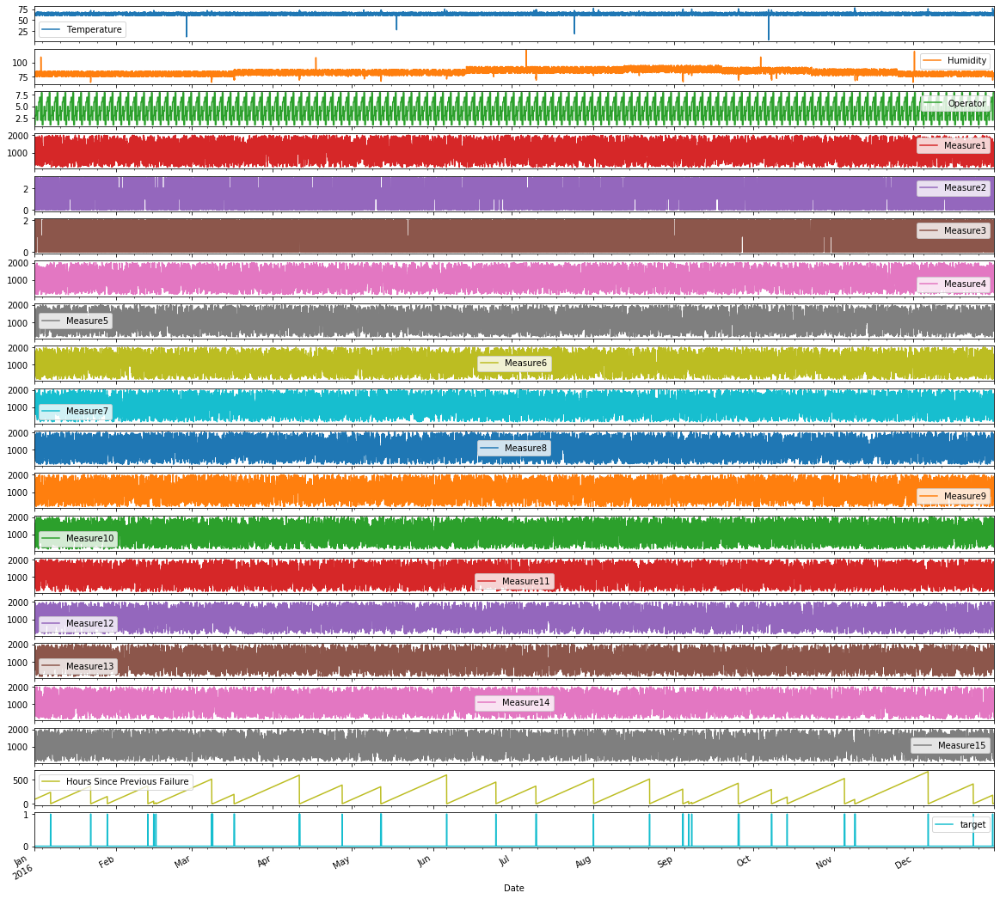

In [19]:

ts_data.plot(figsize=(20,20), subplots=True, layout=(20,1));

Looking at a visual of the features based on the time series, it looks that there really isn't any visible cause from measurements to failure. The data seems to be extremely skewed from one end of the spectrum to the other in short periods of time. Temperature and Humidity look to stay, for the most part, within the same range. As expected, Hours since Failure drops to 0 when a fault is noted.

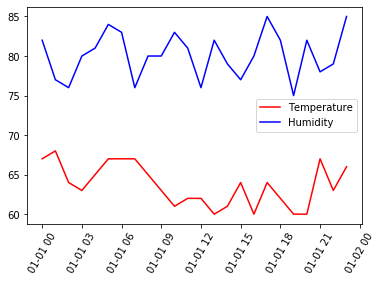

In [20]:
temperature = data.Temperature
humidity = ts_data.Humidity
plt.plot(temperature['2016-01-01'], color='red',label='Temperature')
plt.plot(humidity['2016-01-01'], color='blue',label='Humidity')
plt.legend(loc='center right')
plt.xticks(rotation=60)
plt.show()


This visualization shows the variability in temperature and humidity over a 24 hour period. The fluctuations seem more severe than just regular weather trends showing that these values are based on the machine itself. There seems to be a slight correlation between Temp and Humidity upon first look, but it does not seem too strong.

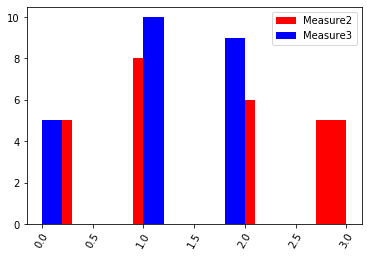

In [21]:
measure2 = ts_data.Measure2
measure3 = ts_data.Measure3
plt.hist(measure2['2016-01-01'], color='red',label='Measure2')
plt.hist(measure3['2016-01-01'], color='blue',label='Measure3')
plt.legend(loc='upper right')
plt.xticks(rotation=60)
plt.show()

Measure 2 has only three values and Measure 3 has four. This would justify classifying these measurements as categorical.

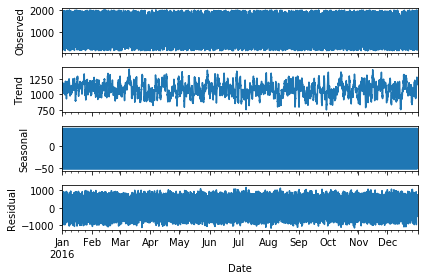

In [22]:
#decomposition of a feature
series = ts_data.Measure15
result = seasonal_decompose(series, model='additive')
result.plot()
plt.show()

Looking at a decomposition of one of the measurements, we see that the data is extremely noisy, with no trend (besides what might be considered a slight cyclical) or seasonality. 

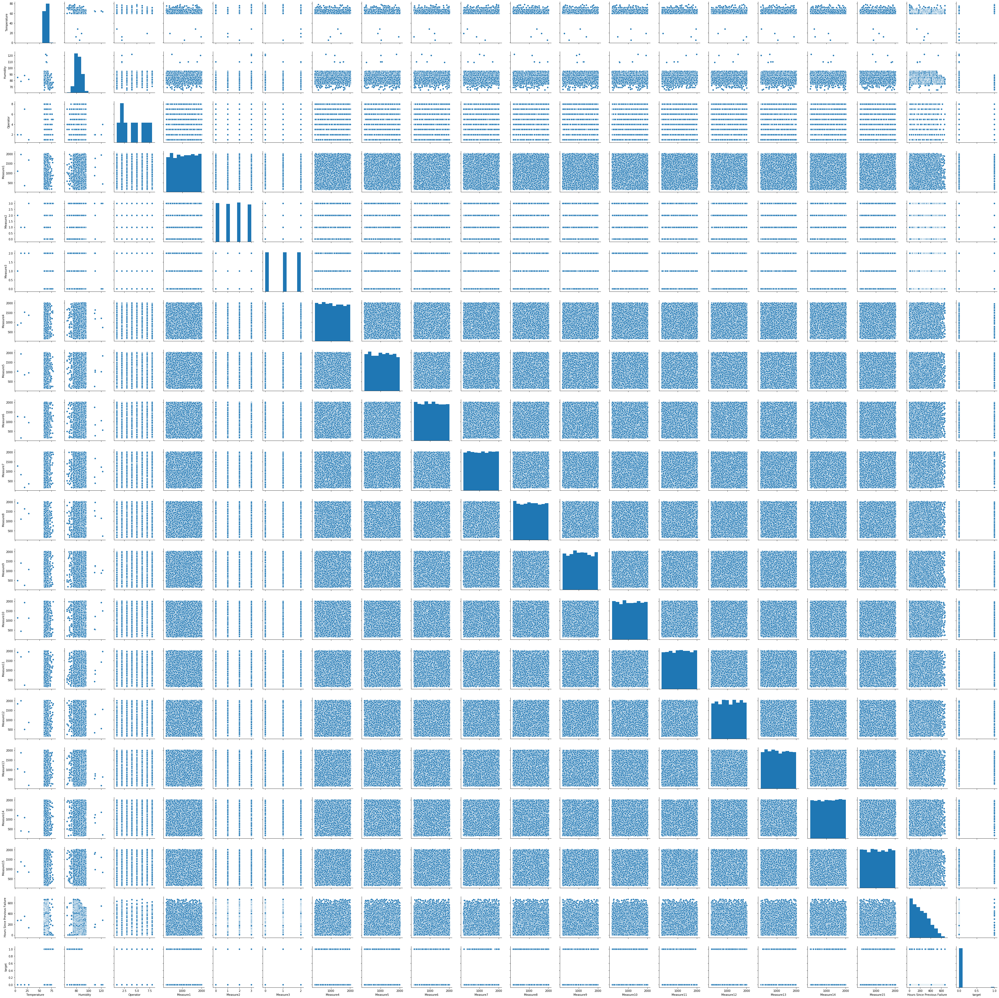

In [23]:
sns.pairplot(ts_data)

The pairplot map reveals many insights. We can see now which variables are categorical and continuous. More interesting is the sample distributions and relationships. It seems there is no relationship between any of the continuous data. This could be a result of heavy sensor noise or synthesized data. This also supports the noisy decomposition of certain measurements.

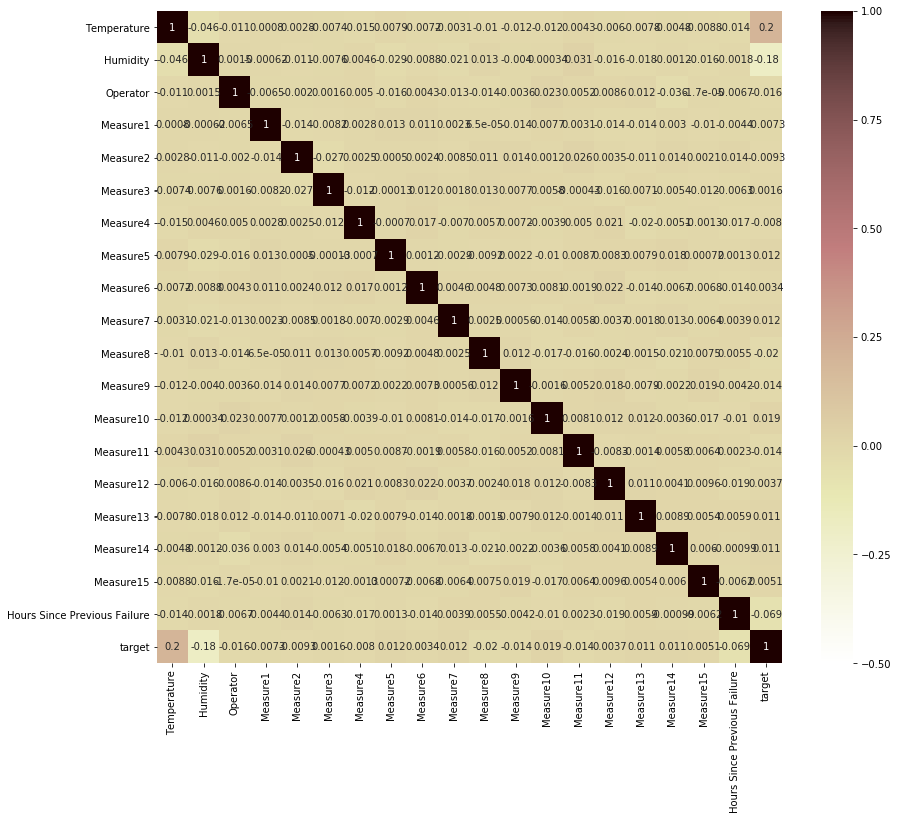

In [24]:
#heatmap code with individual annotation for a multicollinearity map
correlation = ts_data.corr() 
plt.figure(figsize=(14,12)) 
heatmap = sns.heatmap(correlation, annot=True, linewidths = 0, vmin=-.5, cmap='pink_r')

The correlation heatmap reveals little to no collinearity between features which supports the non-relationships spotted in the pairplot visual.

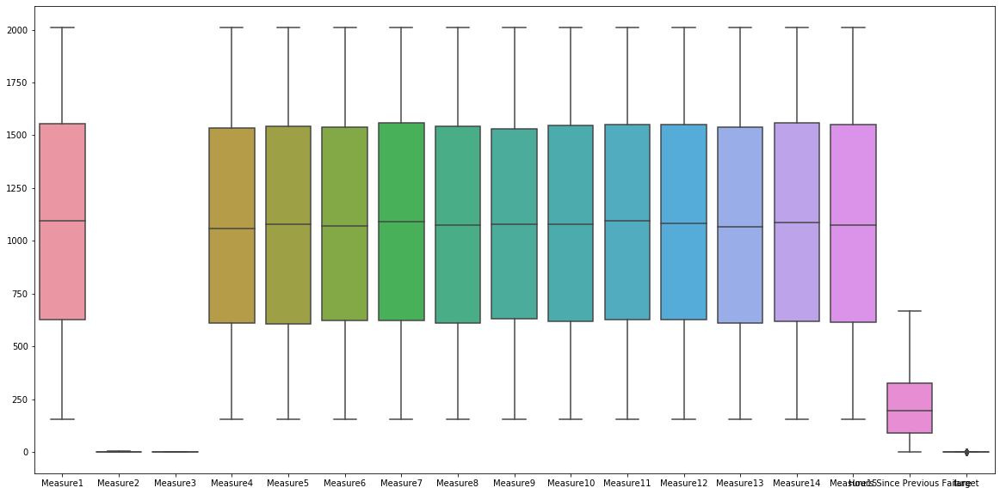

In [25]:
#boxplot to check for outliers
plt.figure(figsize=(20,10))
sns.boxplot(data=ts_data.iloc[:,3:])

The boxplot shows that there are few to no outliers in this data. That can be attributed to amount of noise the data is experiencing.

## Out of Box Model Test

In order to see how the different preprocessing techniques will effect results, we will run an out-of-the-box XGBClassifier on the clean data.

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2179
           1       0.82      0.82      0.82        17

    accuracy                           1.00      2196
   macro avg       0.91      0.91      0.91      2196
weighted avg       1.00      1.00      1.00      2196

Mean XGB Cross-Val Score (k=5):
0.9971542395184049


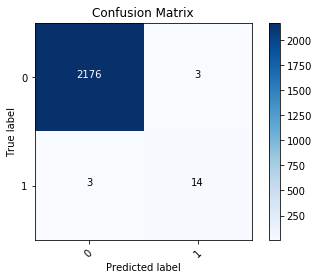

In [26]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(test1_features)
##### set train, test
X_train, X_test, y_train, y_test = train_test_split(scaled_df, test1_target, test_size=0.25)
###### create xgb instance with parameters
clf = xgb.XGBClassifier()
###### fit data
clf.fit(X_train, y_train)
###### make predictions
training_preds = clf.predict(X_train)
val_preds = clf.predict(X_test)
###### run classification report and confusion matrix
cm = confusion_matrix(val_preds, y_test)
gbt_classification_report = classification_report(y_test, val_preds)
print(gbt_classification_report)
###### cross validation score
print('Mean XGB Cross-Val Score (k=5):')
print(cross_val_score(clf, scaled_df, test1_target, cv=5).mean())

plt.imshow(cm,  cmap=plt.cm.Blues) #Create the basic matrix.

#Add title and Axis Labels
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

#Add appropriate Axis Scales
class_names = set(test1_target) #Get class labels to add to matrix
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

#Add Labels to Each Cell
thresh = cm.max() / 2. #Used for text coloring below
#Here we iterate through the confusion matrix and append labels to our visualization.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

#Add a Side Bar Legend Showing Colors
plt.colorbar()

## Kalman Filter

Our first preprocessing method is the Kalman Filter. Usage of the Kalman filter acknowledges that some error and noise is implicit within both the prediction and measurement of the variables we’re interested in tracking. The Kalman filter represents all distributions by Gaussians and iterates over two different things: measurement updates and motion updates. Measurement updates involve updating a prior with a product of a certain belief, while motion updates involve performing a convolution.

In [27]:
#check our data to be filtered
data_for_filter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 14 columns):
Measure1     8784 non-null int64
Measure4     8784 non-null int64
Measure5     8784 non-null int64
Measure6     8784 non-null int64
Measure7     8784 non-null int64
Measure8     8784 non-null int64
Measure9     8784 non-null int64
Measure10    8784 non-null int64
Measure11    8784 non-null int64
Measure12    8784 non-null int64
Measure13    8784 non-null int64
Measure14    8784 non-null int64
Measure15    8784 non-null int64
target       8784 non-null int64
dtypes: int64(14)
memory usage: 960.9 KB


In [28]:
# A Python implementation of the example given in pages 11-15 of "An
# Introduction to the Kalman Filter" by Greg Welch and Gary Bishop,
# University of North Carolina at Chapel Hill, Department of Computer
# Science, TR 95-041,
# https://www.cs.unc.edu/~welch/media/pdf/kalman_intro.pdf

# by Andrew D. Straw
filtered = pd.DataFrame()
sz = len(data_for_filter.index,)
# allocate space for arrays
xhat=np.zeros(sz)      # a posteri estimate of x
P=np.zeros(sz)         # a posteri error estimate
xhatminus=np.zeros(sz) # a priori estimate of x
Pminus=np.zeros(sz)    # a priori error estimate
K=np.zeros(sz)         # gain or blending factor
R = 1.0**2 # estimate of measurement variance, change to see effect

def kalman_filter(data):
# intial parameters
    z = data# observations
    Q = 1e-5 # process variance


# intial guesses
    xhat[0] = data[0]
    P[0] = 1.0

    for k in range(1,sz):
# time update
        xhatminus[k] = xhat[k-1]
        Pminus[k] = P[k-1]+Q

# measurement update
        K[k] = Pminus[k]/( Pminus[k]+R )
        xhat[k] = xhatminus[k]+K[k]*(z[k]-xhatminus[k])
        P[k] = (1-K[k])*Pminus[k]

def kalman_viz(data):
    plt.figure(figsize=(8,8))
    plt.plot(data,'k+',label='noisy measurements')
    plt.plot(xhat,'b-',label='a posteri estimate')
    plt.legend()
    plt.title('data', fontweight='bold')
    plt.xlabel('Iteration')
    plt.ylabel('Measurement')
    plt.show()

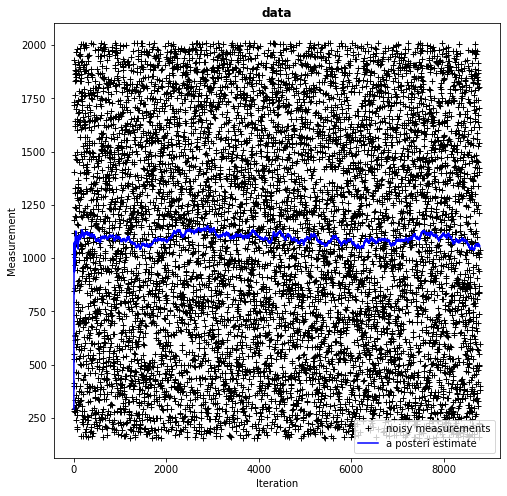

In [29]:
kalman_filter(data_for_filter['Measure1'])
kalman_viz(data_for_filter['Measure1'])
filtered = filtered.assign(a=xhat)

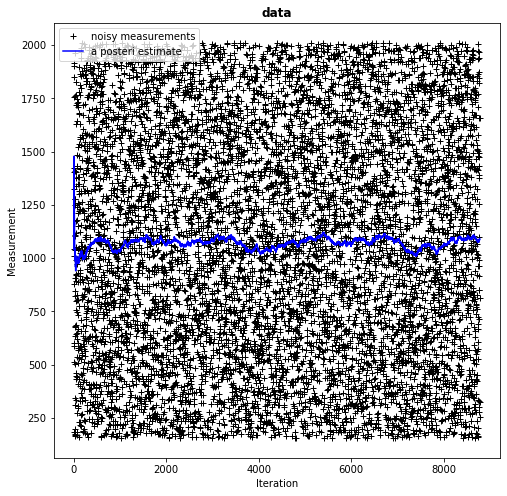

In [30]:
kalman_filter(data_for_filter['Measure4'])
kalman_viz(data_for_filter['Measure4'])
filtered = filtered.assign(b=xhat)

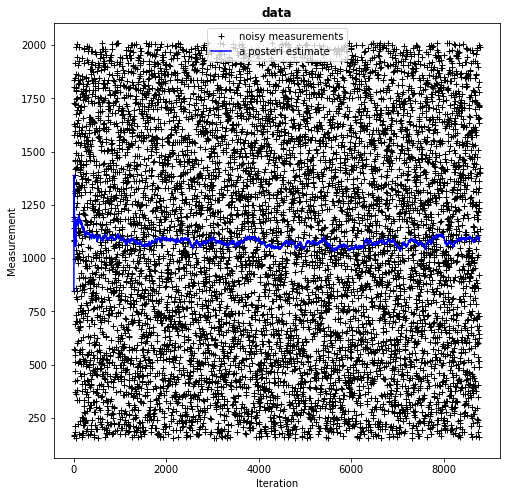

In [31]:
kalman_filter(data_for_filter['Measure5'])
kalman_viz(data_for_filter['Measure5'])
filtered = filtered.assign(c=xhat)

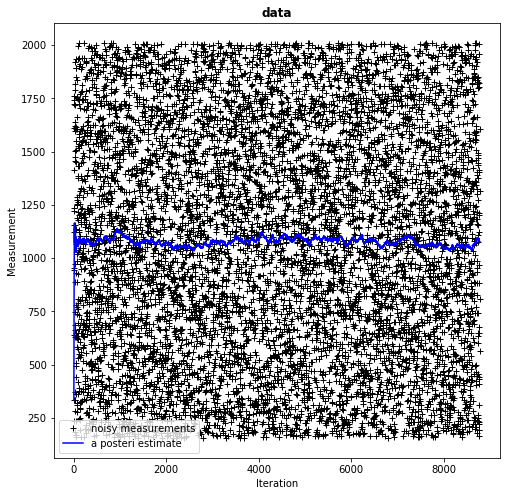

In [32]:
kalman_filter(data_for_filter['Measure6'])
kalman_viz(data_for_filter['Measure6'])
filtered = filtered.assign(d=xhat)

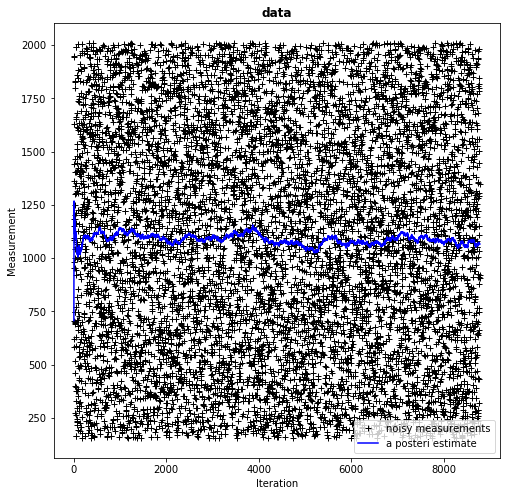

In [33]:
kalman_filter(data_for_filter['Measure7'])
kalman_viz(data_for_filter['Measure7'])
filtered = filtered.assign(e=xhat)

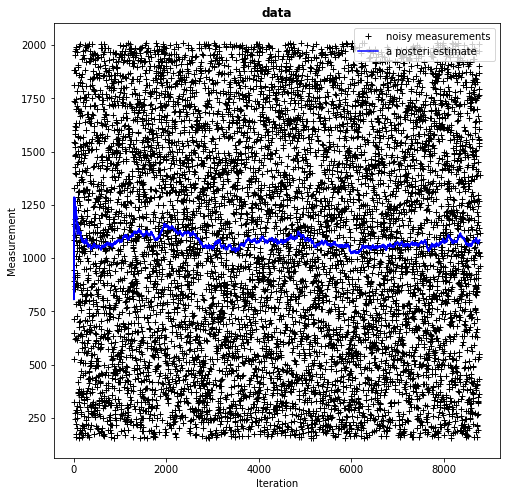

In [34]:
kalman_filter(data_for_filter['Measure8'])
kalman_viz(data_for_filter['Measure8'])
filtered = filtered.assign(f=xhat)

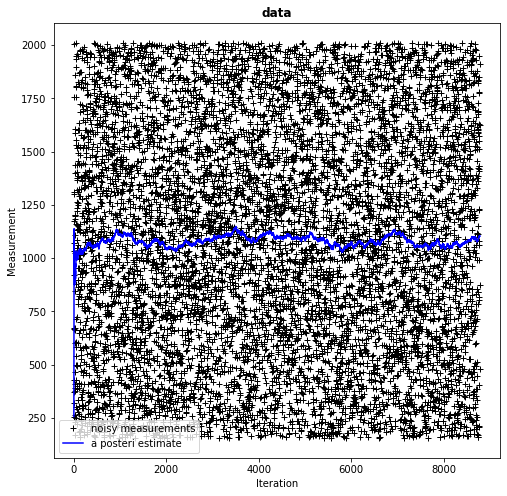

In [35]:
kalman_filter(data_for_filter['Measure9'])
kalman_viz(data_for_filter['Measure9'])
filtered = filtered.assign(g=xhat)

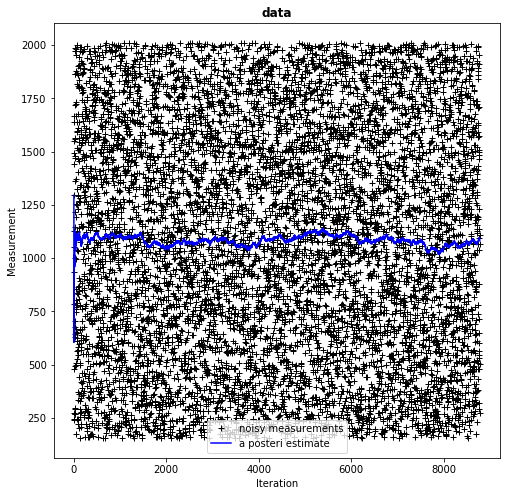

In [36]:
kalman_filter(data_for_filter['Measure10'])
kalman_viz(data_for_filter['Measure10'])
filtered = filtered.assign(h=xhat)

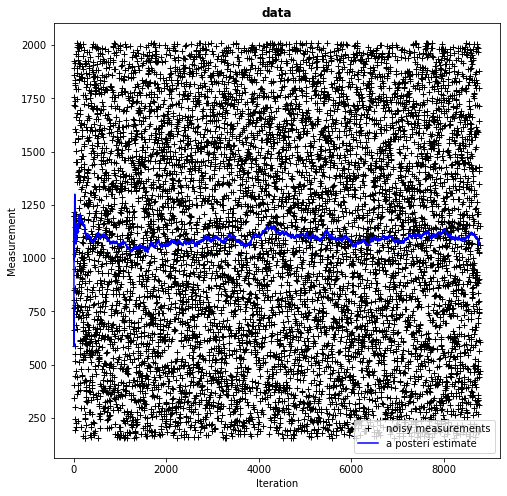

In [37]:
kalman_filter(data_for_filter['Measure11'])
kalman_viz(data_for_filter['Measure11'])
filtered = filtered.assign(i=xhat)

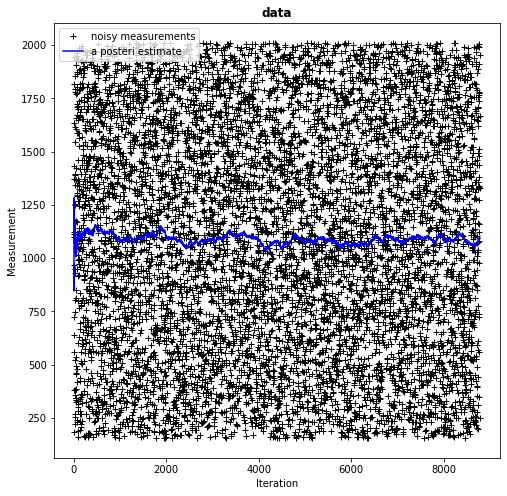

In [38]:
kalman_filter(data_for_filter['Measure12'])
kalman_viz(data_for_filter['Measure12'])
filtered = filtered.assign(j=xhat)

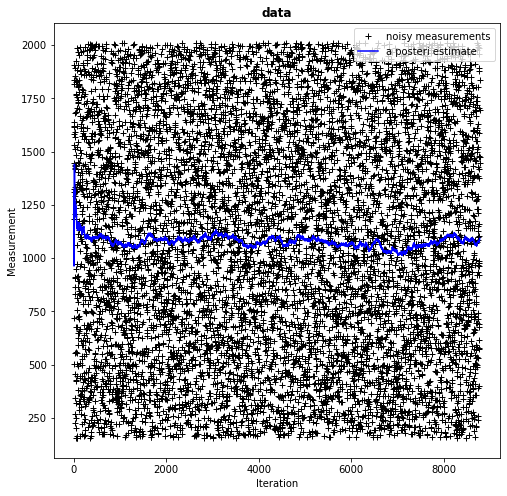

In [39]:
kalman_filter(data_for_filter['Measure13'])
kalman_viz(data_for_filter['Measure13'])
filtered = filtered.assign(k=xhat)

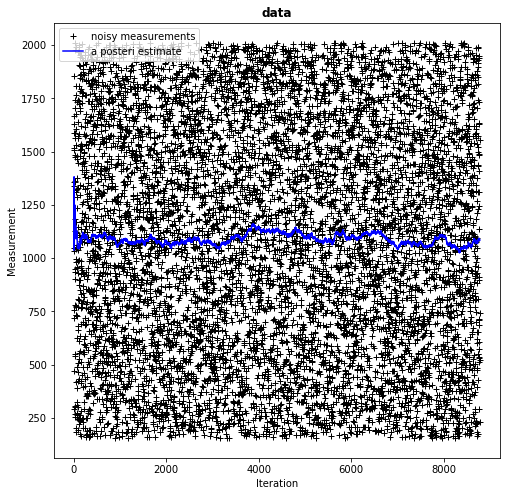

In [40]:
kalman_filter(data_for_filter['Measure14'])
kalman_viz(data_for_filter['Measure14'])
filtered = filtered.assign(l=xhat)

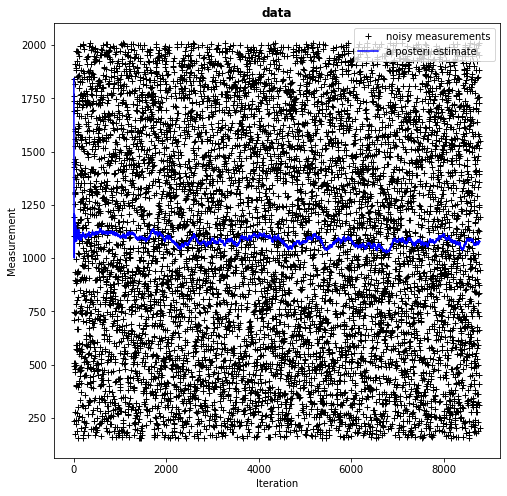

In [41]:
kalman_filter(data_for_filter['Measure15'])
kalman_viz(data_for_filter['Measure15'])
filtered = filtered.assign(m=xhat)

As you can see, the Kalman Filter takes all of the noisy data, iterates through it, and finds a point between the measurement and the prediction, which significantly reduces the variability of the measurements.

## Model Retest After Filter

Now that we have filtered the noisy data, we will run the XGBClassifier on the updated data.

In [42]:
test2_features = filtered.join(data_cat)
test2_target = test1_target

In [43]:
test2_features.head()

,a,b,c,d,e,f,g,h,i,j,k,l,m,Measure2,Measure3,Temperature,Humidity,Operator,Hours Since Previous Failure
0,291.000000,1041.000000,846.000000,334.000000,706.000000,1086.000000,256.000000,1295.000000,766.000000,968.000000,1185.000000,1355.000000,1842.000000,1,1,67,82,1,90
1,735.502222,1478.002185,1020.000870,485.500757,899.500967,804.998595,587.501657,769.997375,584.499093,845.499388,1315.500652,1036.998410,1294.997265,1,1,68,77,1,91
2,959.005207,1155.662751,1205.670341,697.337369,1249.006470,1164.005047,825.338402,604.328822,1032.006853,938.001133,1115.997110,1197.334946,1426.333699,1,1,64,76,1,92
3,856.750326,1305.252299,1362.758254,876.259289,1224.503995,1109.251869,947.008060,826.754401,1212.761466,1062.005190,962.492460,1232.002422,1247.494015,1,1,63,80,1,93
4,1071.013116,1309.402088,1306.603234,747.599712,1267.805794,1234.609016,964.207480,971.212188,1130.604244,1213.413236,1093.201810,1287.005238,1099.386326,1,2,65,81,1,94


              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2178
           1       1.00      0.67      0.80        18

    accuracy                           1.00      2196
   macro avg       1.00      0.83      0.90      2196
weighted avg       1.00      1.00      1.00      2196

Mean XGB Cross-Val Score (k=5):
0.9971542395184049


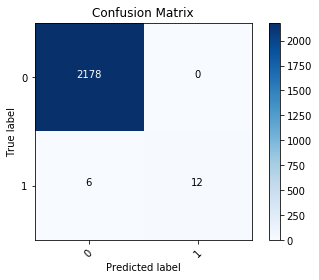

In [44]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(test2_features)
##### set train, test
X_train, X_test, y_train, y_test = train_test_split(scaled_df, test2_target, test_size=0.25)
###### create xgb instance with parameters
clf2 = xgb.XGBClassifier()
###### fit data
clf2.fit(X_train, y_train)
###### make predictions
training_preds = clf2.predict(X_train)
val_preds = clf2.predict(X_test)
###### run classification report and confusion matrix
cm2 = confusion_matrix(y_test, val_preds)
gbt_classification_report2 = classification_report(y_test, val_preds)
print(gbt_classification_report2)
###### cross validation score
print('Mean XGB Cross-Val Score (k=5):')
print(cross_val_score(clf2, scaled_df, test2_target, cv=5).mean())

plt.imshow(cm2,  cmap=plt.cm.Blues) #Create the basic matrix.

#Add title and Axis Labels
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

#Add appropriate Axis Scales
class_names = set(test2_target) #Get class labels to add to matrix
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

#Add Labels to Each Cell
thresh = cm2.max() / 2. #Used for text coloring below
#Here we iterate through the confusion matrix and append labels to our visualization.
for i, j in itertools.product(range(cm2.shape[0]), range(cm2.shape[1])):
        plt.text(j, i, cm2[i, j],
                 horizontalalignment="center",
                 color="white" if cm2[i, j] > thresh else "black")

#Add a Side Bar Legend Showing Colors
plt.colorbar()

The precision did increase to a perfect score, but the recall dropped which also made the F1 score drop. The cross-validation score remained mostly the same. 

## Minority Resampling

As a final preprocessing technique, we will upsample the minority data (the actual failure observations).

In [45]:
features = test2_features
target = test2_target

In [46]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 19 columns):
a                               8784 non-null float64
b                               8784 non-null float64
c                               8784 non-null float64
d                               8784 non-null float64
e                               8784 non-null float64
f                               8784 non-null float64
g                               8784 non-null float64
h                               8784 non-null float64
i                               8784 non-null float64
j                               8784 non-null float64
k                               8784 non-null float64
l                               8784 non-null float64
m                               8784 non-null float64
Measure2                        8784 non-null int64
Measure3                        8784 non-null int64
Temperature                     8784 non-null int64
Humidity                        878

In [47]:
#SMOTENC on dataset
test3_features,test3_target=SMOTENC(categorical_features=[17,14,13],sampling_strategy='auto',n_jobs=-1).fit_sample(features, target)
print(pd.Series(test3_target).value_counts()) #Preview synthetic sample class distribution

1    8703
0    8703
dtype: int64


## Model Test with Filtering and Upsampling

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2201
           1       0.99      0.99      0.99      2151

    accuracy                           0.99      4352
   macro avg       0.99      0.99      0.99      4352
weighted avg       0.99      0.99      0.99      4352

Mean XGB Cross-Val Score (k=5):
0.9475491691259483


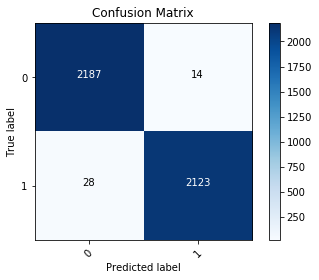

In [48]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(test3_features)
##### set train, test
X_train, X_test, y_train, y_test = train_test_split(scaled_df, test3_target, test_size=0.25)
###### create xgb instance with parameters
clf3 = xgb.XGBClassifier()
###### fit data
clf3.fit(X_train, y_train)
###### make predictions
training_preds = clf3.predict(X_train)
val_preds = clf3.predict(X_test)
###### run classification report and confusion matrix
cm3 = confusion_matrix(y_test, val_preds)
gbt_classification_report3 = classification_report(y_test, val_preds)
print(gbt_classification_report3)
###### cross validation score
print('Mean XGB Cross-Val Score (k=5):')
print(cross_val_score(clf, scaled_df, test3_target, cv=5).mean())

plt.imshow(cm3,  cmap=plt.cm.Blues) #Create the basic matrix.

#Add title and Axis Labels
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')

#Add appropriate Axis Scales
class_names = set(test3_target) #Get class labels to add to matrix
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names, rotation=45)
plt.yticks(tick_marks, class_names)

#Add Labels to Each Cell
thresh = cm3.max() / 2. #Used for text coloring below
#Here we iterate through the confusion matrix and append labels to our visualization.
for i, j in itertools.product(range(cm3.shape[0]), range(cm3.shape[1])):
        plt.text(j, i, cm3[i, j],
                 horizontalalignment="center",
                 color="white" if cm3[i, j] > thresh else "black")

#Add a Side Bar Legend Showing Colors
plt.colorbar()

While there was a slight decline in model validation, the precision and recall were nearly perfect. 

## Conclusion

Some interesting conclusions can be made after this project.

First, the results from the use of the Kalman Filter. While overall precision improved, the ability of the model to reproduce those results (recall) actually decreased. Model validation was uneffected.

Second, the method of upsampling the minority target (SMOTENC) in conjuction with the filter did improve both precision and recall to 99%. Although the model validation decreased about 4%, the improvements in the model were very significant, providing at least 8% improvement in recall. 

Further investigation into other filter or signal processing methods into classification would be of benefit. Also, having a greater insight into what equipment was used to produce the data as well as specifics into what was measured can further assist in improving model performance.